# Customer Segmentation 

### Machine Learning II Project

   - Bruno Moreira            | 20211574@novaims.unl.pt
   - Carolina Braziel Shaul   | 20211557@novaims.unl.pt
   - Madalena Dias Frango     | 20211522@novaims.unl.pt

## Table of Contents



[1. Importing Data & Libraries](#1.-bullet)<br>
<br>
[2. Preliminary Data Adjustments](#2.-bullet)<br>
<br>
[3. Customer Segmentation - K-Meanss](#2.-bullet)<br> 
<br>
[3.1.Finding Optimal Number of Clusters and Fitting the Model](#3.1.-bullet)<br>
<br>
[3.2. Assessing the Results](#3.2.-bullet) <br>
<br>
[3.3. Adjusting the Segments](#3.3.-bullet)<br>
<br>
[4. Final Interpretation of the Segments](#4.-bullet)<br>


<br>

---
<br>

<a class="anchor" id="1.-bullet">     
    

### 1. Importing Data & Libraries 

</a>


In [194]:
#Basic Packages
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import date 
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix
import pickle


#Plot Maps
from folium.plugins import HeatMap, MarkerCluster 

#Functions
import Functions


%load_ext autoreload
%autoreload 2

#Ignore warnings
import warnings
warnings.filterwarnings("ignore")


# Matplotlib Options
plt.rcParams['figure.figsize'] = [16, 8]
font = {'weight' : 'bold',
        'size'   : 14}
plt.rc('font', **font)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [195]:
individuals = pd.read_csv('clientes_preprocessed.csv')
transactions = pd.read_csv('Customer Basket Dataset.csv')
prod_mapping = pd.read_excel('Product Mapping Excel File.xlsx')

In [196]:
individuals.set_index('customer_id', inplace=True)

<br>

---
<br>

<a class="anchor" id="2.-bullet">     
    

### 2. Preliminary Data Adjustments

</a>

#### Joining Features

> First let's retrieve the correlation insights found during the exploration and create new two features based on them.

In [197]:
individuals['lifetime_spend_animal_protein'] = individuals[['lifetime_spend_fish', 'lifetime_spend_meat']].sum(axis=1)
individuals['lifetime_spend_technology'] = individuals[['lifetime_spend_videogames', 'lifetime_spend_electronics']].sum(axis=1)

In [198]:
corr_matrix = individuals.drop(['lifetime_spend_fish', 'lifetime_spend_meat', 'lifetime_spend_videogames', 'lifetime_spend_electronics'], axis = 1).corr()
Functions.get_high_correlations(corr_matrix, 0.66)

,Variable 1,Variable 2,Correlation
12,longitude,longitude_encoded,0.956726
11,latitude,latitude_encoded,0.955708
10,lifetime_total_distinct_products,lifetime_spend_animal_protein,0.932928
3,lifetime_spend_groceries,lifetime_total_distinct_products,0.926119
2,distinct_stores_visited,percentage_of_products_bought_promotion,0.923021
6,lifetime_spend_groceries,lifetime_spend_animal_protein,0.915666
5,lifetime_spend_groceries,total_lifetime_spend,0.913175
0,kids_home,minors_in_household,0.895671
13,total_lifetime_spend,lifetime_spend_animal_protein,0.872337
9,lifetime_total_distinct_products,total_lifetime_spend,0.855891


> Finally, let's define variables to aid with plotting and exploring the results.

In [199]:
columns = ['lifetime_spend_groceries', 'lifetime_spend_electronics', 'lifetime_spend_vegetables',
 'lifetime_spend_nonalcohol_drinks', 'lifetime_spend_alcohol_drinks', 'lifetime_spend_hygiene',
 'lifetime_spend_videogames', 'lifetime_total_distinct_products', 'percentage_of_products_bought_promotion',
 'year_first_transaction', 'total_lifetime_spend', 'age',  'lifetime_spend_technology', 'lifetime_spend_animal_protein',
 'typical_hour', 'distinct_stores_visited']


continuous = ['lifetime_spend_groceries', 'lifetime_spend_electronics', 'lifetime_spend_vegetables',
       'lifetime_spend_nonalcohol_drinks', 'lifetime_spend_alcohol_drinks',
       'lifetime_spend_meat', 'lifetime_spend_fish', 'lifetime_spend_hygiene',
       'lifetime_spend_videogames', 'lifetime_total_distinct_products', 'lifetime_spend_animal_protein', 'lifetime_spend_technology',
       'percentage_of_products_bought_promotion', 'year_first_transaction', 'typical_hour', 'total_lifetime_spend', 'age', 'distinct_stores_visited']


discrete = ['kids_home', 'teens_home',
       'number_complaints',  'minors_in_household']


binary = ['customer_gender', 'loyalty_card']

#### Data Scalling

> As the data did not appear to follow sufficiently a normal distribution, nor present extensive outliers, the data was scalled using the MinMax Scaller.

In [200]:
scaler = MinMaxScaler()
individuals_num = individuals.drop(['customer_name', 'region'], axis=1)
scaled_data = scaler.fit_transform(individuals_num)
scaled_data = pd.DataFrame(scaled_data, index= individuals_num.index, columns=individuals_num.columns)

<br>

---
<br>

<a class="anchor" id="3.-bullet">     
    

### 3. Customer Segmentation - K-Means

</a>

<a class="anchor" id="3.1.-bullet">     
    

#### 3.1. Finding Optimal Number of Clusters and Fitting the Model
</a>

> First, let's understand what is the most appropriate number of clusters given the following features: <br><br>
         'kids_home', 'teens_home', 'number_complaints',
 'distinct_stores_visited', 'lifetime_spend_groceries', 'typical_hour',
 'lifetime_spend_vegetables','lifetime_spend_nonalcohol_drinks','lifetime_spend_alcohol_drinks',
 'lifetime_spend_hygiene','lifetime_total_distinct_products','percentage_of_products_bought_promotion',
 'year_first_transaction','loyalty_card','total_lifetime_spend',
 'education','lifetime_spend_animal_protein','lifetime_spend_videogames', 'lifetime_spend_electronics'

In [201]:
fit_variables = ['kids_home', 'teens_home', 'number_complaints',
 'distinct_stores_visited', 'lifetime_spend_groceries', 'typical_hour',
 'lifetime_spend_vegetables','lifetime_spend_nonalcohol_drinks','lifetime_spend_alcohol_drinks',
 'lifetime_spend_hygiene','lifetime_total_distinct_products','percentage_of_products_bought_promotion',
 'year_first_transaction','loyalty_card','total_lifetime_spend',
 'education','lifetime_spend_animal_protein','lifetime_spend_videogames', 'lifetime_spend_electronics']

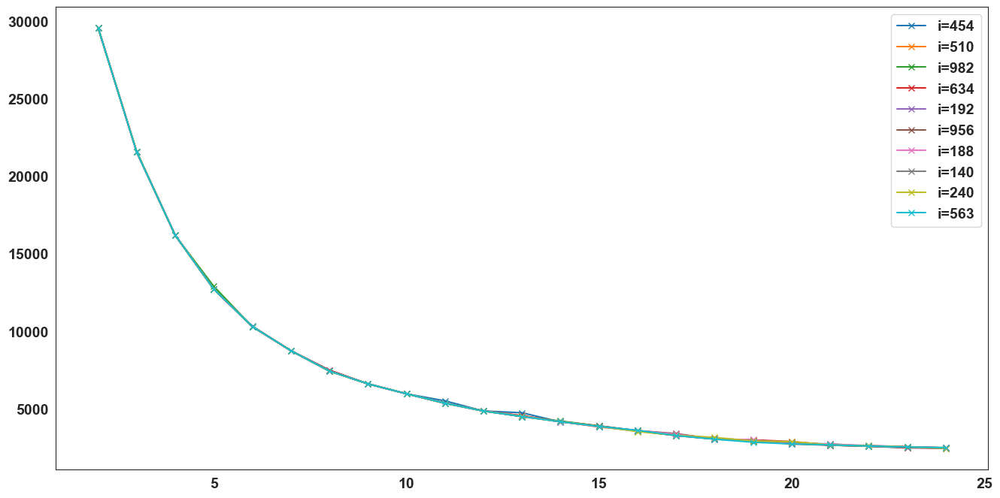

In [202]:
Functions.plot_inertia(scaled_data[fit_variables], 25, 10)

> So far, it seems that the best number of clusters is 6. e will now fit a K-Means model with 6 clusters and the features described afore.

In [203]:
# kmeans_solZ = KMeans(n_clusters=6, random_state=42).fit(scaled_data[fit_variables])
# pickle.dump(kmeans_solZ, open('kmeans_solutionz.sav', 'wb'))

In [204]:
solutionz = pickle.load(open('kmeans_solutionz.sav', 'rb'))

In [205]:
individuals['cluster_kmeansZ'] =  solutionz.predict(scaled_data[fit_variables])

<a class="anchor" id="3.2.-bullet">     
    

#### 3.2. Assessing the Results
</a>

In [206]:
individuals_num = individuals.drop(['customer_name', 'region'], axis=1)

> Now let's assess the results using the UMAP and Silhuette method.

##### UMAP

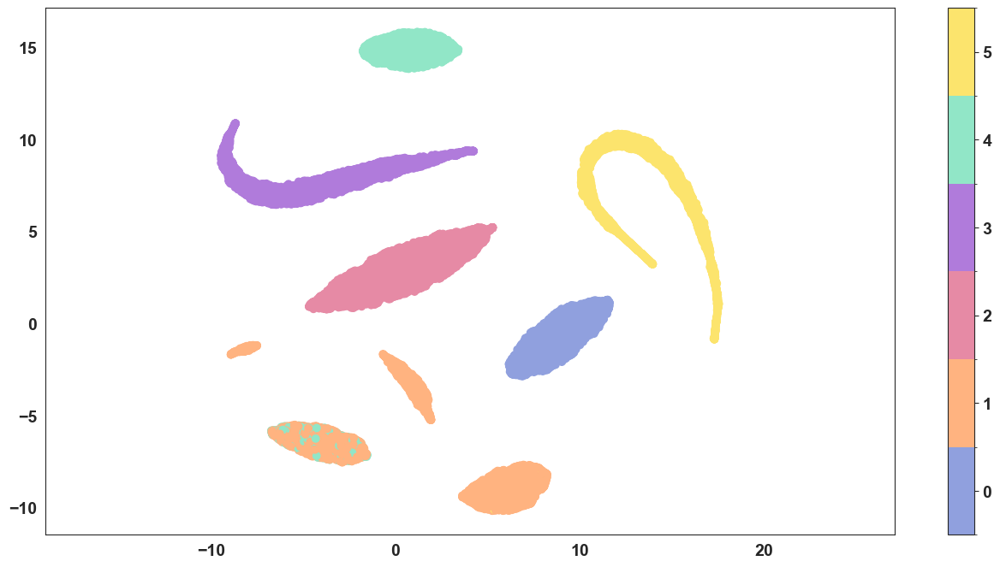

In [207]:
Functions.umap_plot(individuals_num, 'cluster_kmeansZ')

##### Silhouette Method

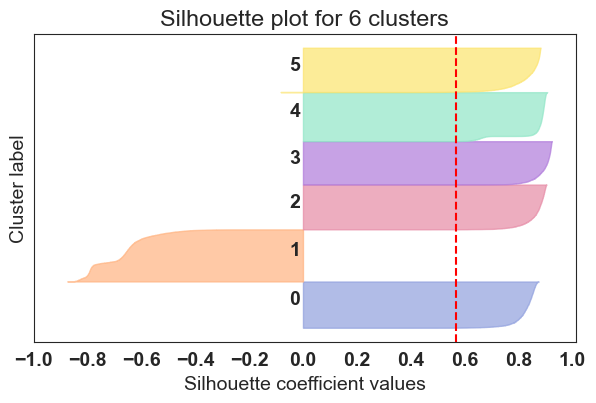

Silhouette score for 6 clusters: 0.5682


In [208]:
Functions.silhoette_method(individuals_num, 'cluster_kmeansZ')

In [209]:
abnormal2= 1
abnormal3 = 4

> It seems that all clusters - with exceptions to cluster 1 and 4 - are pretty well defined. A group of observations belonging to cluster 4 appear to fit better on cluster 1. Let's analyze the observations within both these segments to determine what can be done to define them better.

#####  Analyzing the Segments

In [210]:
Functions.compare_clusters(individuals, 'cluster_kmeansZ')

,0,1,2,3,4,5,general_mean
customer_gender,0.491567,0.499007,0.499790,0.494143,0.503549,0.490370,0.496574
kids_home,1.000203,0.289478,0.997901,0.689588,2.773643,1.160423,1.155404
teens_home,0.069904,0.240931,0.271620,0.068547,1.621907,0.771217,0.516827
number_complaints,1.010567,0.437827,1.551008,0.500000,0.838097,0.310899,0.770169
distinct_stores_visited,20.001829,2.260422,7.999580,1.992625,3.010934,2.000212,6.159636
lifetime_spend_groceries,302.959764,2463.876737,14993.307935,200.406291,5208.133321,997.506878,4008.813629
lifetime_spend_electronics,20.000000,567.170727,199.970403,4999.557484,283.368310,50.364656,972.556727
typical_hour,8.991668,17.008302,11.914568,20.951844,17.562440,9.983492,14.461107
lifetime_spend_vegetables,300.231863,258.496481,799.560034,20.033623,581.569538,1499.006138,568.474340
lifetime_spend_nonalcohol_drinks,300.431823,298.580762,900.786104,1500.946855,848.445809,20.204233,633.505206


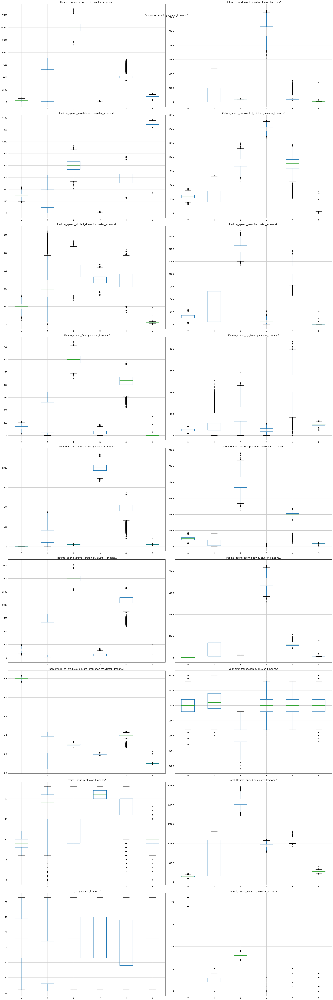

In [211]:
Functions.boxplot_by(individuals, continuous, 'cluster_kmeansZ')

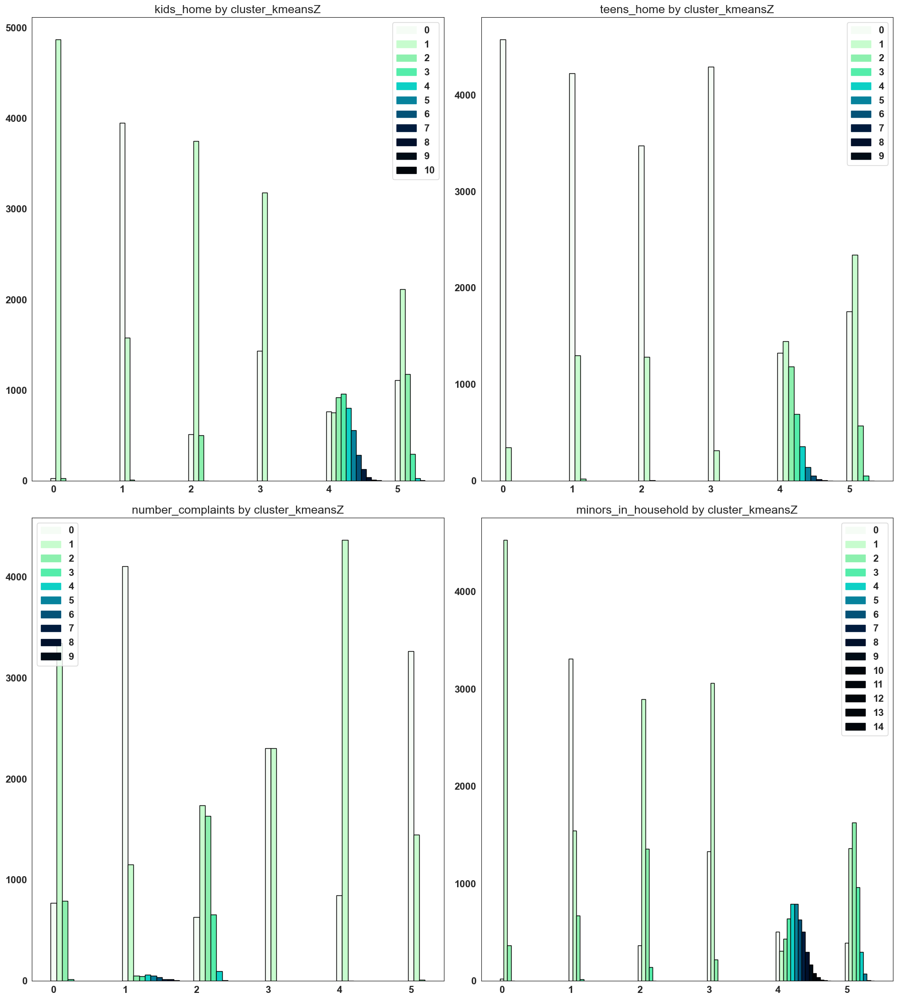

In [212]:
Functions.plot_bar_charts(individuals, discrete, 'cluster_kmeansZ', True)

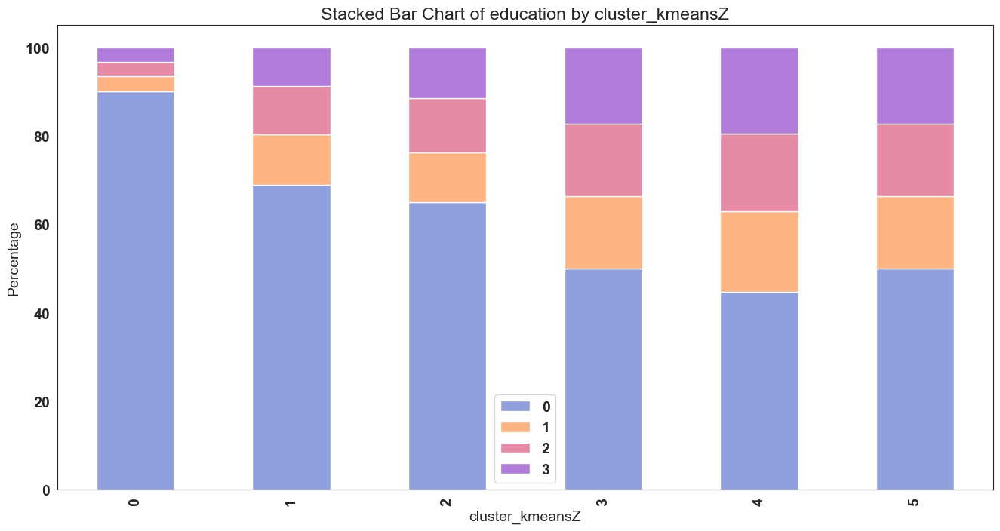

In [213]:
Functions.stacked_bar_chart(individuals, 'education', 'cluster_kmeansZ')

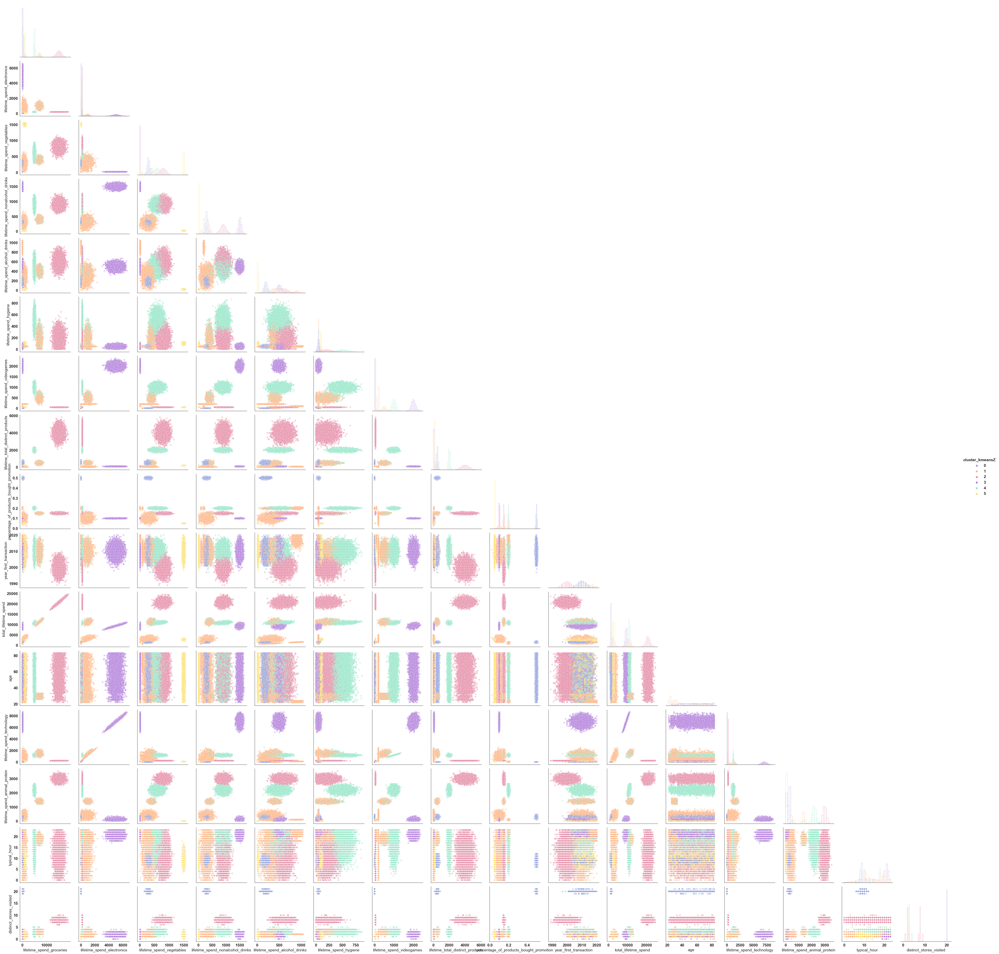

In [214]:
columns.append('cluster_kmeansZ')
Functions.pairplot(individuals, columns, 'cluster_kmeansZ', sampling=0)

In [215]:
columns.remove('cluster_kmeansZ')

> The hypothesis that all clusters seem well defined with exceptions to Cluster 1 and 4 holds. These present to be quite ambiguous and have some outliers. To understand how can they be improved, we will analyze solely the observations from these clusters.

In [216]:
customers_subset = individuals[(individuals['cluster_kmeansZ'] == abnormal2) |( individuals['cluster_kmeansZ'] == abnormal3)]

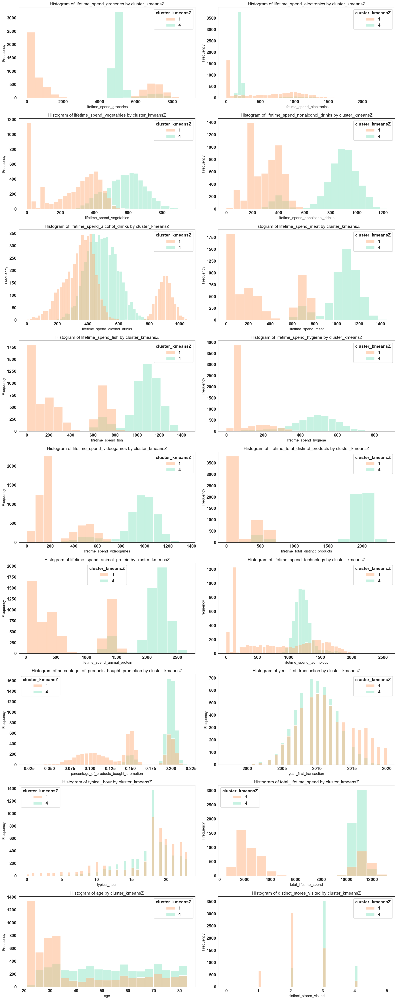

In [217]:
Functions.plot_histograms(customers_subset, cols= continuous, hue_var='cluster_kmeansZ')

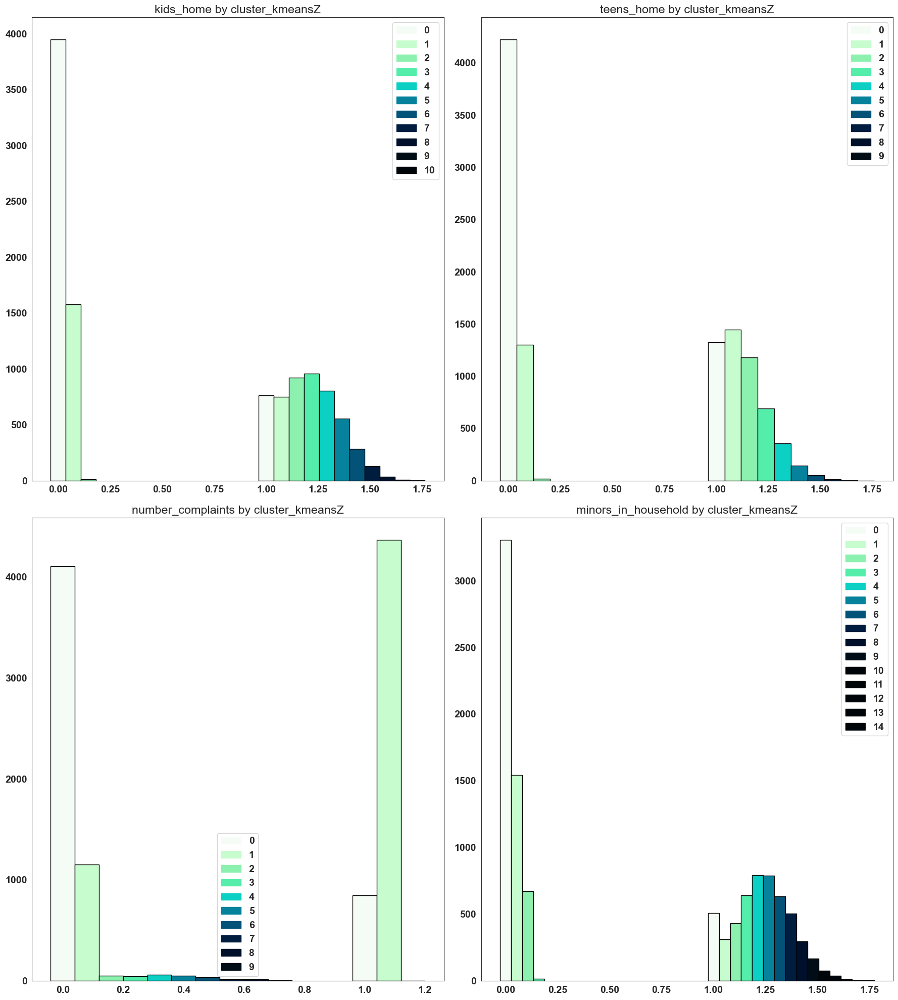

In [218]:
Functions.plot_bar_charts(customers_subset, discrete, 'cluster_kmeansZ')

<a class="anchor" id="3.3.-bullet">     
    

#### 3.3. Adjusting the Segments
</a>

> It seems that there is a particular group that consumes a lot of alcohol, which is defined jointly with customers that do not spend much on alcohol.For this reason, we will manually split this group of observations based on the mentioned characteristic.

In [219]:
customers_subset['cluster_alcohol_division'] = np.where(customers_subset['lifetime_spend_alcohol_drinks'] >= 750, 6, customers_subset['cluster_kmeansZ'])

In [220]:
individuals = individuals.join(customers_subset['cluster_alcohol_division'], on ='customer_id')

In [221]:
individuals['cluster_alcohol_division'] = np.where((individuals['cluster_alcohol_division'].isnull() == True),
                                                    individuals['cluster_kmeansZ'], 
                                                   individuals['cluster_alcohol_division'])

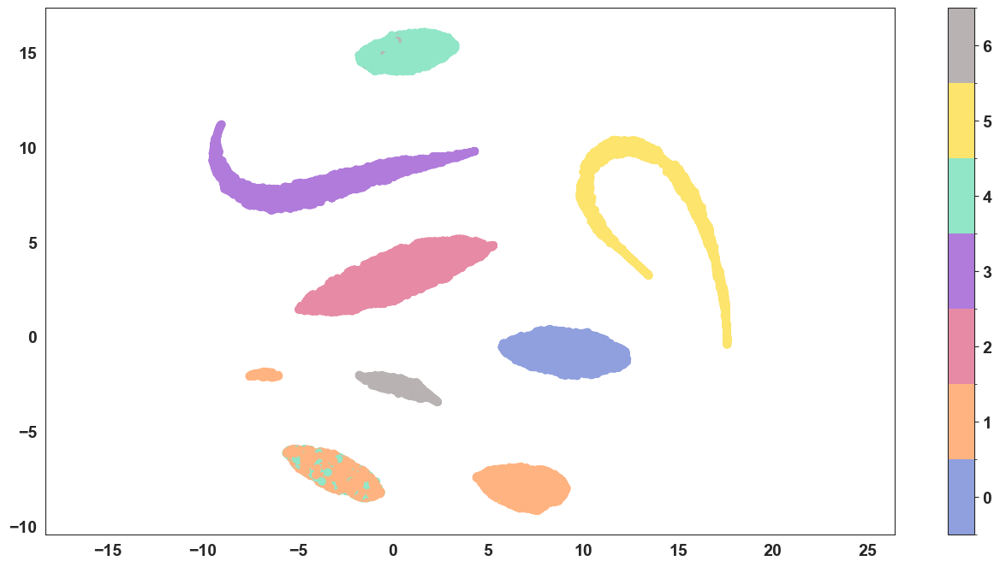

In [222]:
Functions.umap_plot(individuals.drop(['customer_name', 'region', 'cluster_kmeansZ'], axis=1), 'cluster_alcohol_division')

> It seems that the observations that we wanted to address were still not completely arranged. The analysis provided prior found that, in terms of demographic features, it appears that there is not much to distinguish these clusters, perhaps with exception to the number of minors in the household. However, in regards to expenditure, many product categories present a bimodal distribution. For this reason, another K-Means instance will be applied to this group of customers, using only features within this scope.

In [223]:
customers_subset = individuals[(individuals['cluster_alcohol_division'] == 1) | (individuals['cluster_alcohol_division'] == 4)]

In [224]:
fit_variables0 = ['lifetime_spend_groceries', 'lifetime_spend_electronics', 'lifetime_spend_vegetables', 
                  'lifetime_spend_nonalcohol_drinks', 'lifetime_spend_alcohol_drinks', 'lifetime_spend_hygiene',
                  'lifetime_spend_videogames', 'total_lifetime_spend',  'lifetime_spend_animal_protein']

> Once again, we use the MinMax scaler.

In [225]:
customers_subset_num = customers_subset.drop(['customer_name', 'region'], axis=1)
scaled_data2 = scaler.fit_transform(customers_subset_num)
scaled_data2 = pd.DataFrame(scaled_data2, index= customers_subset_num.index, columns=customers_subset_num.columns)

In [226]:
# subcluster_k2 = KMeans(n_clusters=2, random_state=0).fit(scaled_data2[fit_variables0])
# pickle.dump(subcluster_k2, open('subcluster_k2.sav', 'wb'))

In [227]:
subcluster_k2 = pickle.load(open('subcluster_k2.sav', 'rb'))
customers_subset['cluster_kmeans2'] =  subcluster_k2.predict(scaled_data2[fit_variables0])

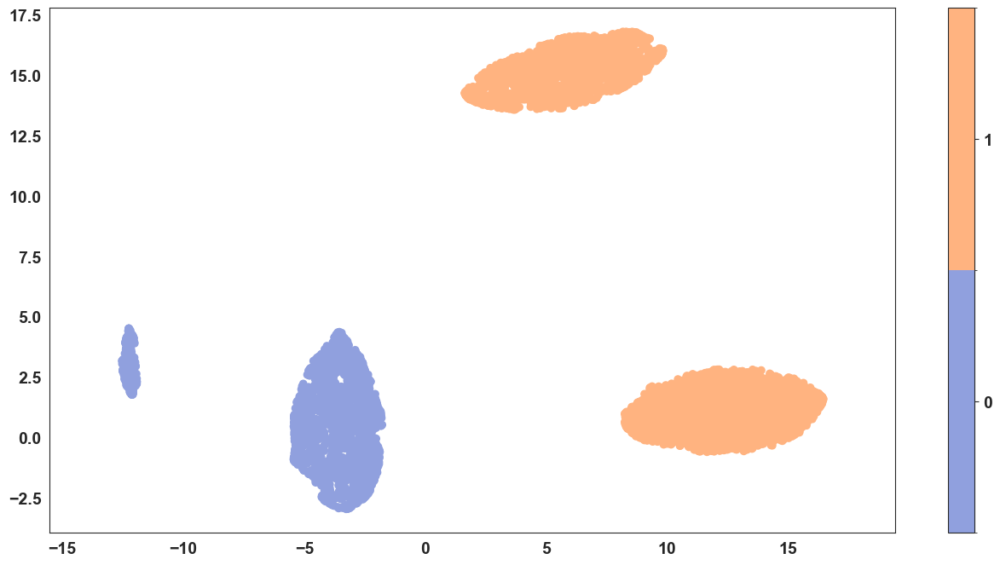

In [228]:
Functions.umap_plot(customers_subset.drop(['region', 'customer_name'], axis=1), 'cluster_kmeans2')

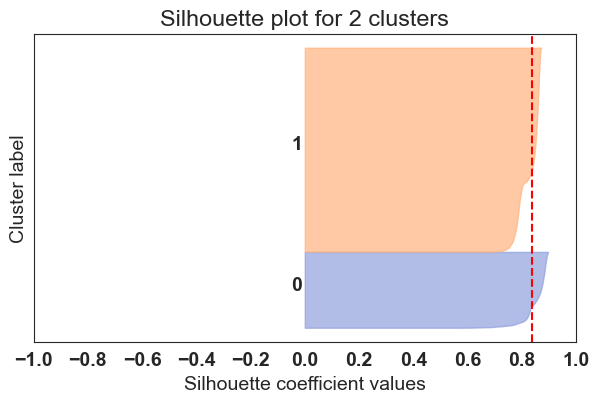

Silhouette score for 2 clusters: 0.8364


In [229]:
Functions.silhoette_method(customers_subset.drop(['region', 'customer_name'], axis=1), 'cluster_kmeans2')

> The UMAP and the Silhoette Coefficient Plot suggests that these observations may be now better segmented. This will now be verified by some analysis.

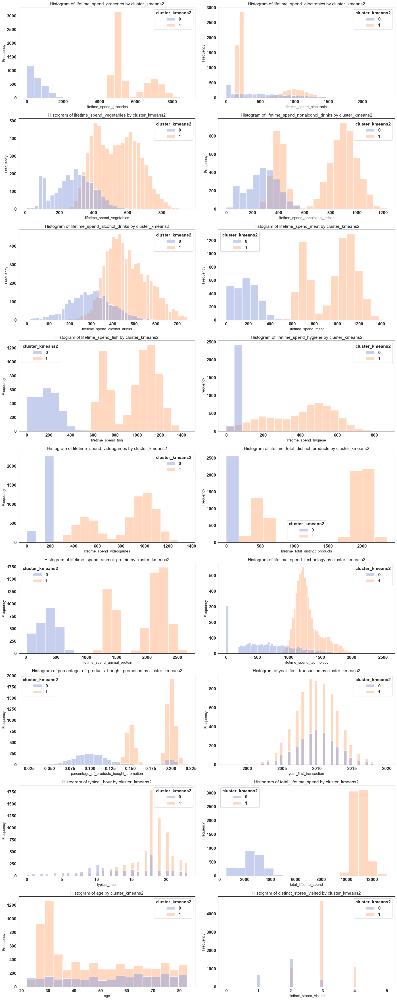

In [230]:
Functions.plot_histograms(customers_subset.drop(['region', 'customer_name'], axis=1), continuous, 'cluster_kmeans2')

In [231]:
customers_subset.replace({'cluster_kmeans2': {1: 4, 0:1}}, inplace=True)
individuals = individuals.join(customers_subset['cluster_kmeans2'], on='customer_id')

In [232]:
individuals['segment'] = np.where(individuals['cluster_kmeans2'].isnull() == True, individuals['cluster_alcohol_division'], individuals['cluster_kmeans2'])
individuals.drop(['cluster_alcohol_division', 'cluster_kmeans2', 'cluster_kmeansZ'], axis=1, inplace=True)

In [233]:
Functions.integer_convert(individuals, ['segment'])

,customer_name,customer_gender,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,typical_hour,lifetime_spend_vegetables,...,longitude_encoded,total_lifetime_spend,minors_in_household,birthday,birthmonth,age,education,lifetime_spend_animal_protein,lifetime_spend_technology,segment
customer_id,,,,,,,,,,,,,,,,,,,,,
4239,Sara Moscowitz,1,0,0,0,2,91.0,20.0,22,22.0,...,-9.150181,1545.0,0,10,9,24,0,101.0,125.0,6
19330,Donald Robertson,0,1,0,0,2,197.0,5958.0,21,20.0,...,-9.163855,10219.0,1,26,6,42,0,166.0,7922.0,3
2272,Felicia Bradshaw,1,1,1,0,20,397.0,20.0,9,310.0,...,-9.115927,1753.0,2,31,1,36,3,374.0,25.0,0
25288,Emma Williams,1,3,4,1,2,5282.0,237.0,12,499.0,...,-9.152875,11195.0,7,17,6,81,0,2149.0,1315.0,4
12829,Hilda Huerta,1,0,0,0,2,82.0,22.0,21,9.0,...,-9.150181,1370.0,0,31,1,23,0,78.0,125.0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
625,Karen Watts,1,0,0,1,2,209.0,5474.0,20,18.0,...,-9.166444,9730.0,0,1,11,49,3,32.0,7458.0,3
26447,Curtis Thompson,0,0,0,0,3,185.0,1066.0,15,267.0,...,-9.128820,2416.0,0,21,2,37,0,88.0,1263.0,1
182,Richard Carter,0,0,0,0,2,83.0,23.0,23,23.0,...,-9.166444,1491.0,0,14,1,22,0,107.0,117.0,6


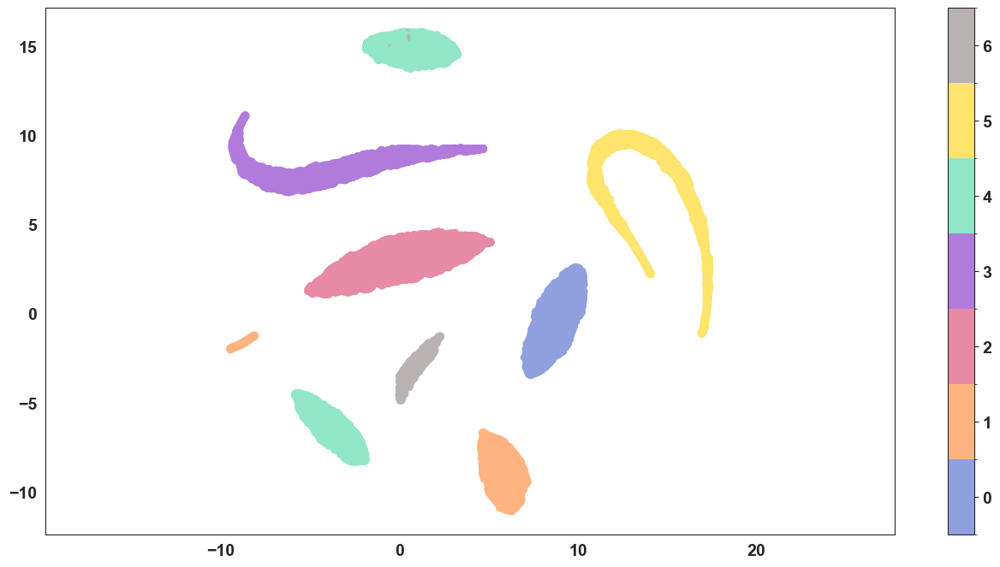

In [234]:
Functions.umap_plot(individuals.drop(['customer_name', 'region'], axis=1), 'segment')

> The UMAP suggests that the segmentation is now more adequate. A preliminary analysis on all segments distributions will be pursued to confirm this expectation. 

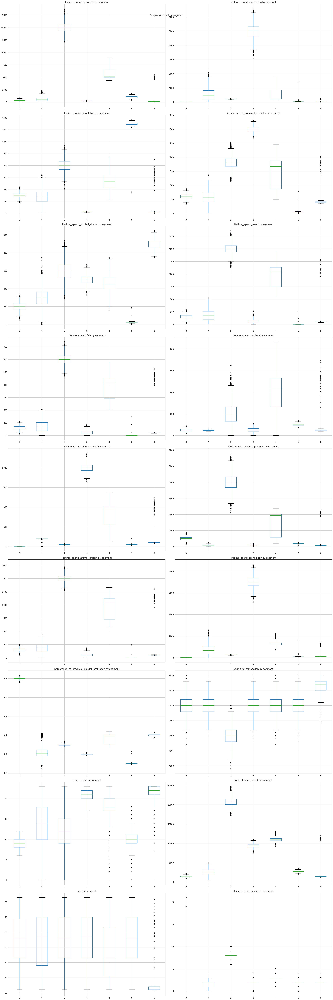

In [235]:
Functions.boxplot_by(individuals, continuous, 'segment')

> However, there are some outliers in Cluster 6 that perhaps fit better as observations belonging to Cluster 4. This calls for a final adjustment, which requires first to identify which are the outlier observations in Cluster 6.

In [236]:
cluster6 = individuals[individuals['segment'] == 6]

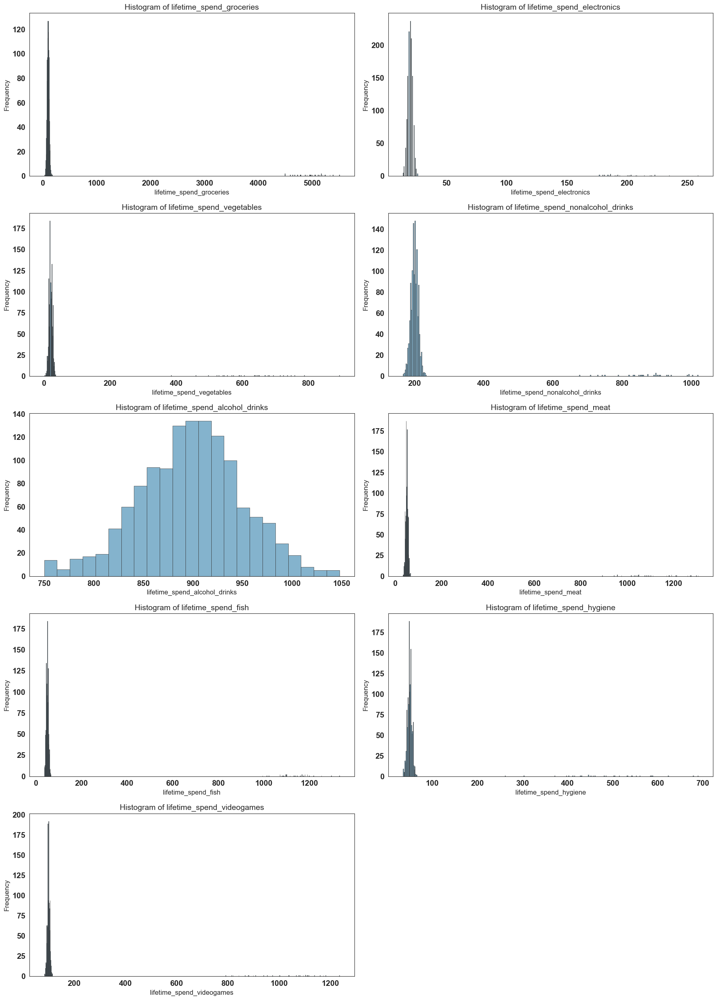

In [237]:
Functions.plot_histograms(cluster6, [ 'lifetime_spend_groceries', 'lifetime_spend_electronics', 'lifetime_spend_vegetables',
       'lifetime_spend_nonalcohol_drinks', 'lifetime_spend_alcohol_drinks',
       'lifetime_spend_meat', 'lifetime_spend_fish', 'lifetime_spend_hygiene',
       'lifetime_spend_videogames' ])

> It seems that the outliers within this cluster regard specifically high spenders in all product categories except alcohol. These will migrate to Cluster 4.

In [238]:
cluster6['high_spenders'] = np.where(cluster6['total_lifetime_spend'] > 8000, 1, 0)
individuals['segment'] = np.where(((individuals['segment'] == 6) & (individuals['total_lifetime_spend'] > 8000)), 4, individuals['segment'])

> Now the segmentation appears to be complete.

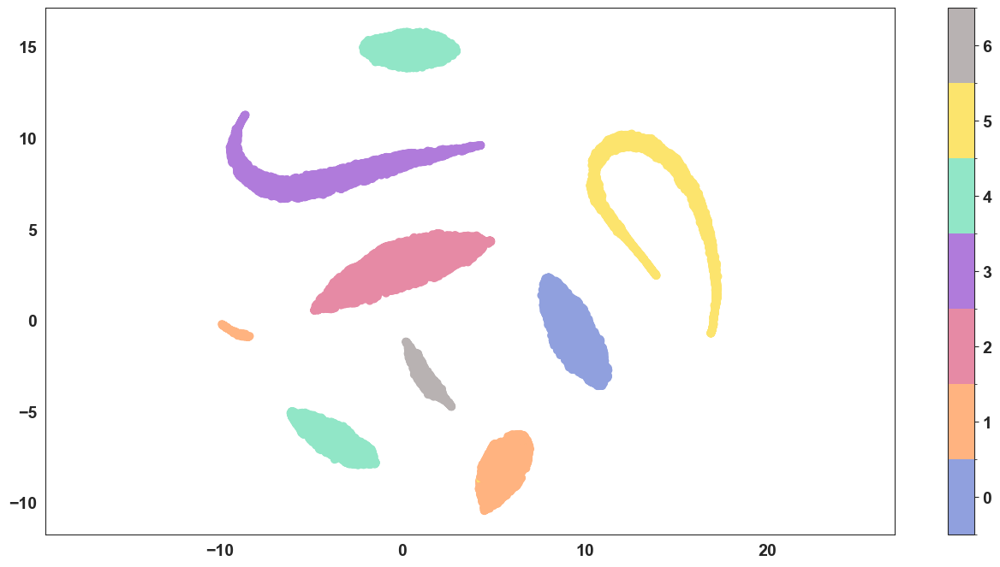

In [239]:
Functions.umap_plot(individuals.drop(['customer_name', 'region'], axis=1), 'segment')

<br>

---
<br>

<a class="anchor" id="4.-bullet">     
    

### 4. Final Interpretation of the Segments

</a>

##### Naming the Segments

In [240]:
cluster_names = {0: 'Promotion-Driven', 1: 'Economically Conservative', 2: 'Loyal', 3: 'Tech Experts', 4:'Middle Class', 5:'Plant-Based', 6: 'Young Beverage Enthusiasts'}
individuals['segment_name'] = individuals['segment'].map(lambda x : cluster_names[x])

##### Mean Values per Variable per Segment

In [241]:
Functions.compare_clusters(individuals.drop(['birthday', 'customer_gender', 'birthmonth', 'lifetime_spend_meat', 'lifetime_spend_fish', 'latitude_encoded', 'longitude_encoded'], axis=1), ['segment_name'])

,Economically Conservative,Loyal,Middle Class,Plant-Based,Promotion-Driven,Tech Experts,Young Beverage Enthusiasts,general_mean
kids_home,0.507393,0.997901,2.124081,1.160423,1.000203,0.689588,0.016064,1.155404
teens_home,0.519455,0.271620,1.218475,0.771217,0.069904,0.068547,0.000000,0.516827
number_complaints,0.932296,1.551008,0.633953,0.310899,1.010567,0.500000,0.000000,0.770169
distinct_stores_visited,1.890272,7.999580,3.008070,2.000212,20.001829,1.992625,2.000000,6.159636
lifetime_spend_groceries,566.351362,14993.307935,5652.388817,997.506878,302.959764,200.406291,100.314056,4008.813629
lifetime_spend_electronics,538.341245,199.970403,462.830235,50.364656,20.000000,4999.557484,19.900402,972.556727
typical_hour,13.467704,11.914568,17.910938,9.983492,8.991668,20.951844,21.606426,14.461107
lifetime_spend_vegetables,277.979767,799.560034,536.761493,1499.006138,300.231863,20.033623,20.124498,568.474340
lifetime_spend_nonalcohol_drinks,278.073930,900.786104,736.971177,20.204233,300.431823,1500.946855,199.912450,633.505206
lifetime_spend_alcohol_drinks,298.635798,599.145886,468.839602,20.202328,199.776671,499.866161,900.949398,382.203433


##### Dimension of Segments

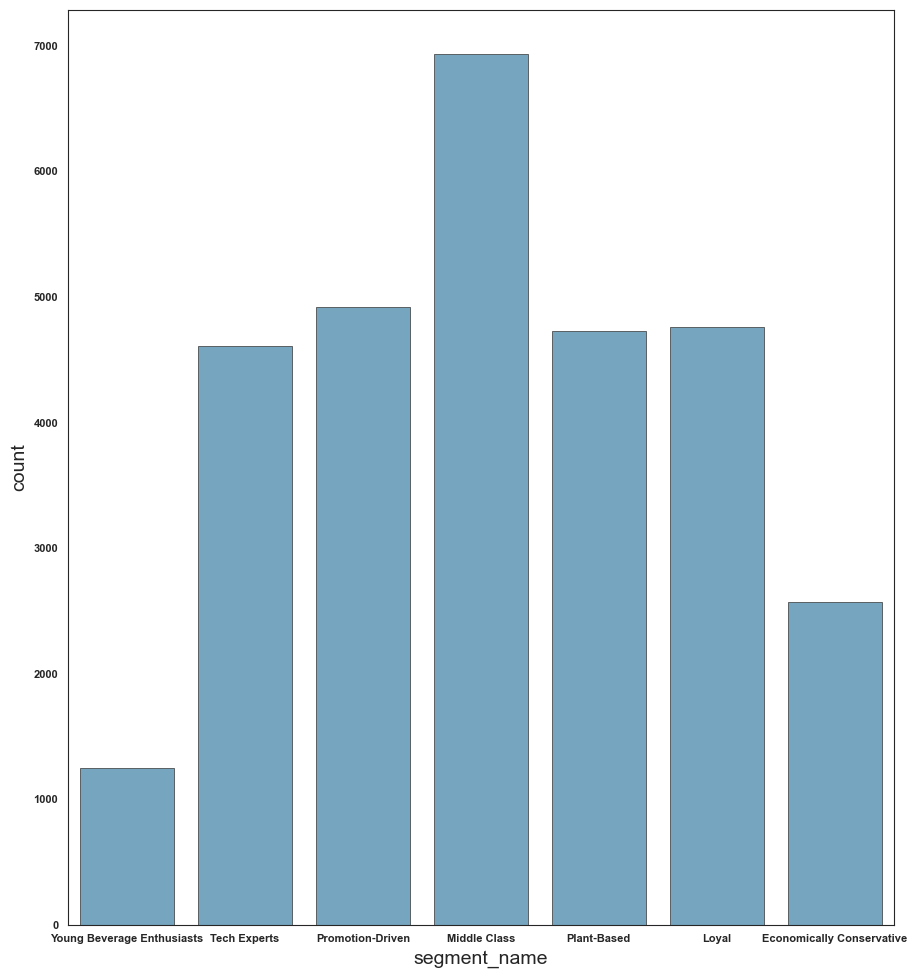

In [242]:
Functions.plot_bar_charts(individuals, ['segment_name'])

#### Visualizing Discrete Variables by Segment

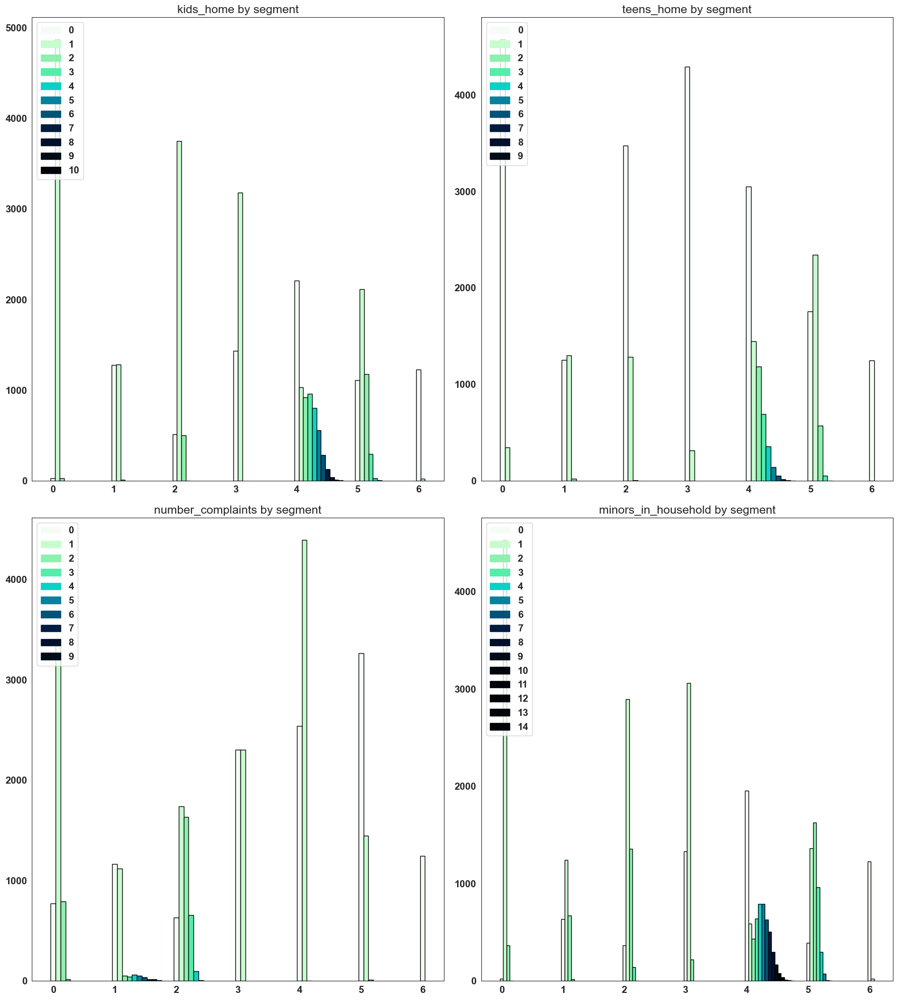

In [243]:
Functions.plot_bar_charts(individuals, discrete, 'segment')

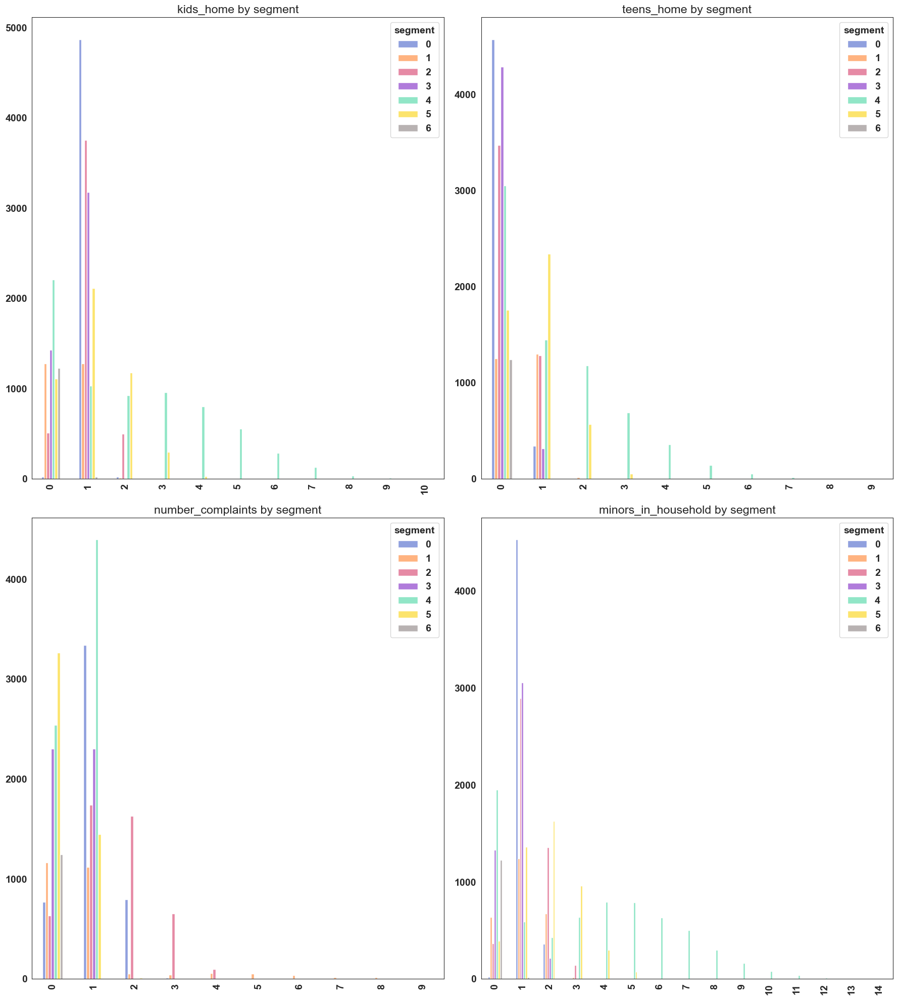

In [244]:
Functions.plot_bar_charts(individuals, discrete, 'segment', False)

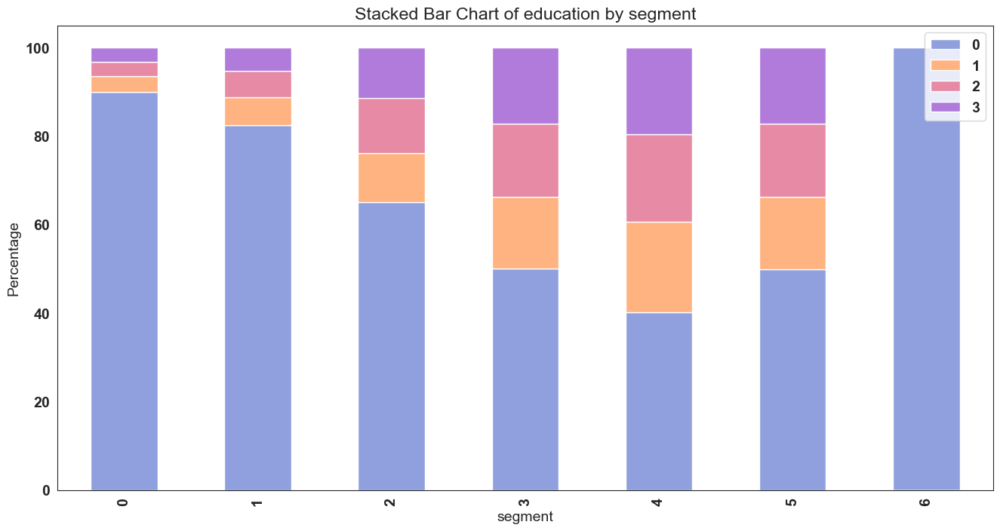

In [245]:
Functions.stacked_bar_chart(individuals, 'education', 'segment')

##### Visualizing Continuous Variables by Segment

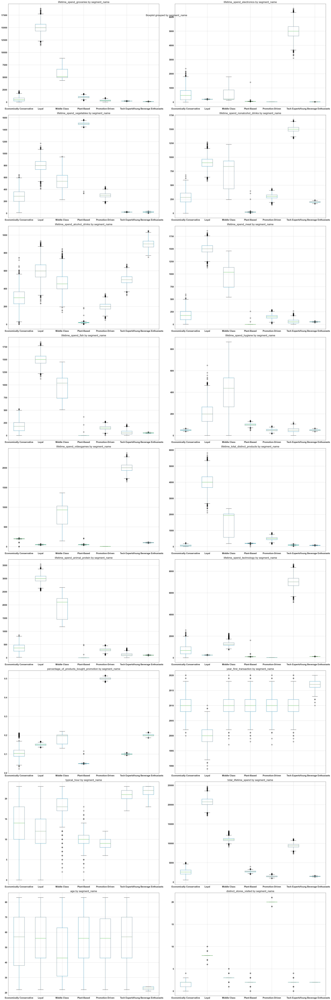

In [246]:
Functions.boxplot_by(individuals, continuous, 'segment_name')

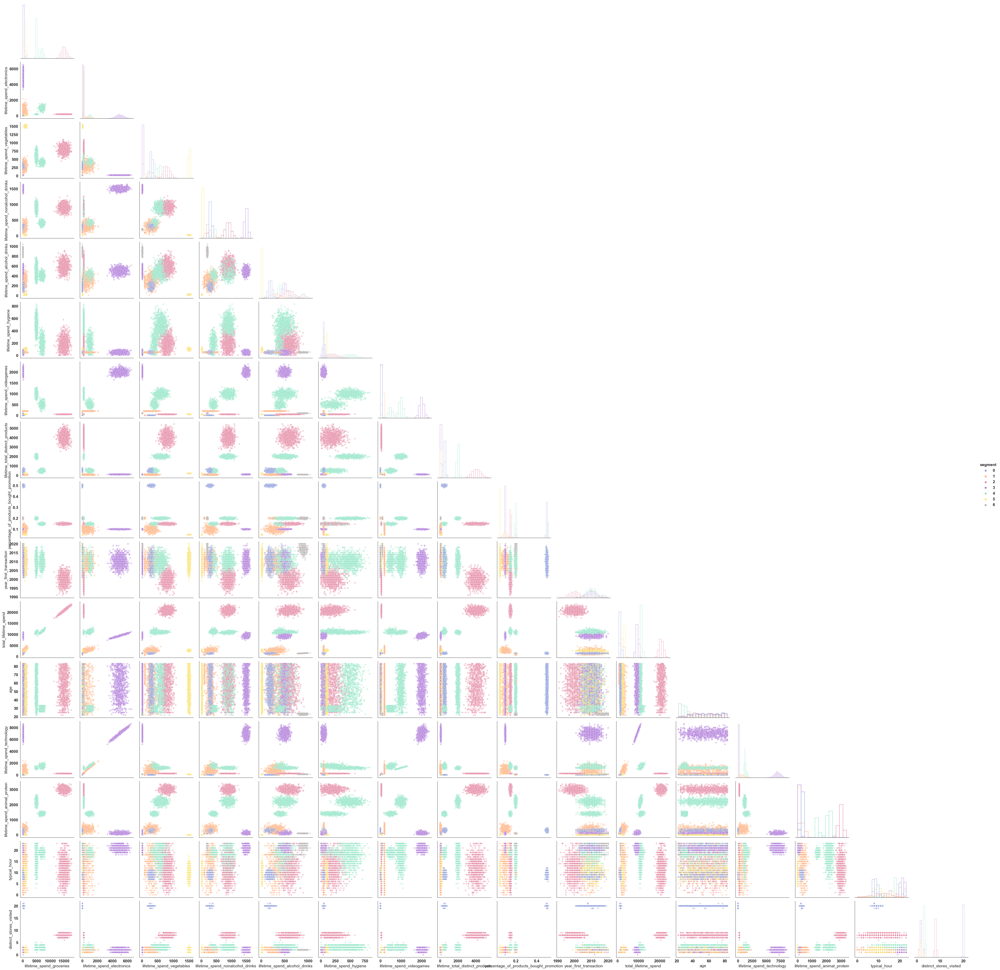

In [247]:
columns.append('segment')
Functions.pairplot(individuals, columns, 'segment')

##### Exporting the customer data with all segments and respective names

In [248]:
supermarkets = pd.read_csv('supermarkets preprocessed.csv')
supermarkets['segment'] = 7
supermarkets.set_index('customer_id', inplace=True)
customers = pd.concat([individuals, supermarkets], axis=0)
custoomers = customers[['segment', 'segment_name']]
customers.to_csv('customers_clustered.csv', index=True)